<a href="https://colab.research.google.com/github/thiagobcoelho25/analise-airbnb-sigmoidal/blob/main/Analisando_os_Dados_do_Airbnb(San_Diego).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 3.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*

---

# Análise dos Dados do Airbnb - *San Diego*

O [Airbnb](https://www.airbnb.com.br/) já é considerado como sendo a **maior empresa hoteleira da atualidade**. Ah, o detalhe é que ele **não possui nenhum hotel**!

Conectando pessoas que querem viajar (e se hospedar) com anfitriões que querem alugar seus imóveis de maneira prática, o Airbnb fornece uma plataforma inovadora para tornar essa hospedagem alternativa.

No final de 2018, a Startup fundada 10 anos atrás, já havia **hospedado mais de 300 milhões** de pessoas ao redor de todo o mundo, desafiando as redes hoteleiras tradicionais.

Uma das iniciativas do Airbnb é disponibilizar dados do site, para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.

<center><img alt="Analisando Airbnb" width="10%" src="https://www.area360.com.au/wp-content/uploads/2017/09/airbnb-logo.jpg"></center>

**Neste *notebook*, iremos analisar os dados referentes à cidade de San Diego, e ver quais insights podem ser extraídos a partir de dados brutos.**

## San Diego
San Diego é uma cidade dos Estados Unidos localizada no sul do estado da Califórnia, sendo a segunda cidade mais populosa do estado, possui quase 1,4 milhão de habitantes de acordo com o censo nacional de 2020. San Diego possui varios pontos para a pratica de surf em sua costa, sendo bem comun o aluguel de casas na regiao costeira.

## Obtenção dos Dados


In [ ]:
# importar os pacotes necessarios
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium

In [ ]:
# importar o arquivo listings.csv para um DataFrame
df = pd.read_csv('http://data.insideairbnb.com/united-states/ca/san-diego/2021-12-20/visualisations/listings.csv')

## Análise dos Dados


In [ ]:
# listando todas as colunas

**Dicionário das variáveis**

* `id` - identificador exclusivo do Airbnb para o anúncio
* `name` - nome da propriedade anunciada
* `host_id` - identificador exclusivo do Airbnb para o anfitrião/usuário
* `host_name` - Nome do anfitrião. Geralmente apenas o primeiro nome
* `neighbourhood_group` - esta coluna não contém nenhum valor válido
* `neighbourhood` - nome do bairro
* `latitude` - coordenada da latitude da propriedade usando a projeção do Sistema Geodésico Mundial (WGS84)
* `longitude` - coordenada da longitude da propriedade usando a projeção do Sistema Geodésico Mundial (WGS84)
* `room_type` - informa o tipo de quarto que é oferecido
* `price` - preço da diário em moeda local
* `minimum_nights` - quantidade mínima de noites para reservar
* `number_of_reviews` - número de reviews que a propriedade possui
* `last_review` - data do último review
* `reviews_per_month` - quantidade de reviews por mês
* `calculated_host_listings_count` - quantidade de imóveis do mesmo anfitrião na cidade/região
* `availability_365` - número de dias de disponibilidade dentro de 365 dias
* `number_of_reviews_ltm` - quantidade de reviews nos últimos 12 meses
* `license` - licença/autorização ou número de registro

Antes de iniciar qualquer análise, vamos verificar a cara do nosso *dataset*, analisando as 5 primeiras entradas.

In [ ]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,5570,Ocean front condo on the sand,8435,Jef Karchin,NaN,Mission Bay,32.78481,-117.25313,Entire home/apt,2050,3,0,NaN,NaN,3,156,0,NaN
1,29967,"Great home, 10 min walk to Beach",129123,Michael,NaN,Pacific Beach,32.80751,-117.25760,Entire home/apt,234,4,72,2021-12-16,0.52,5,246,10,NaN
2,38245,Point Loma: Den downstairs,164137,Melinda,NaN,Roseville,32.74217,-117.21931,Private room,74,1,146,2021-08-15,1.06,3,347,3,NaN
3,54001,"La Jolla Garden Cottage: Blks to Ocn; 2Bdms, 1...",252692,Marsha,NaN,La Jolla,32.81301,-117.26856,Entire home/apt,258,5,280,2021-11-26,2.10,2,34,37,NaN
4,62274,"charming, colorful, close to beach",302986,Isabel,NaN,Pacific Beach,32.80583,-117.24244,Entire home/apt,80,1,689,2021-12-05,5.12,2,322,68,NaN


### **Q1. Quantos atributos (variáveis) e quantas entradas o nosso conjunto de dados possui? Quais os tipos das variáveis?**

In [ ]:
# identificar o volume de dados do DataFrame
print(f'O dataframe possui: {df.shape[0]} linhas, ou entradas')
print("O dataframe possui: {} colunas\n".format(df.shape[1]))

# verificar os tipos das colunas do dataset
df.dtypes

O dataframe possui: 10301 linhas, ou entradas
O dataframe possui: 18 colunas



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                           float64
dtype: object

### **Q2. Qual a porcentagem de valores ausentes no *dataset*?**

In [ ]:
# ordenar em ordem decrescente as variáveis por seus valores ausentes
((df.isna().sum() / df.shape[0])).sort_values(ascending=False)*100

license                           100.000000
neighbourhood_group               100.000000
reviews_per_month                  14.678187
last_review                        14.678187
host_name                           0.145617
minimum_nights                      0.000000
number_of_reviews_ltm               0.000000
availability_365                    0.000000
calculated_host_listings_count      0.000000
number_of_reviews                   0.000000
id                                  0.000000
name                                0.000000
room_type                           0.000000
longitude                           0.000000
latitude                            0.000000
neighbourhood                       0.000000
host_id                             0.000000
price                               0.000000
dtype: float64

Podemos perceber que tanto a coluna `neighbourhood_group` quanto `license` possuem todas as suas entradas com o valor de NaN, possivelmente dados faltantes, assim como parte dos dados de `reviews_per_month` e `last_review`. Não contribuindo significativamente para a analise, por possuirem baixo valor preditivo, iremos excluir nesse momento as colunas `neighbourhood_group` e `license` do dataframe.

In [ ]:
df.drop(['neighbourhood_group', 'license'], axis=1, inplace=True)

Ainda que `host_name`, `reviews_per_month` e `last_review` tenham valores nulos, possuem muitas entradas importantes, não sendo possivel simplesmente excluí-las da base. Dessa forma iremos tratar os valores de `host_name` nessa etapa.

In [ ]:
df[df['host_name'].isna()].head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1681,14116320,Modern La Jolla Escape,66115585,NaN,La Jolla,32.83220,-117.25315,Entire home/apt,1647,1,0,NaN,NaN,3,263,0
1682,14116330,Villa Portofino,66115585,NaN,La Jolla,32.84609,-117.26016,Entire home/apt,3049,1,0,NaN,NaN,3,322,0
1683,14116332,Forever Views,66115585,NaN,La Jolla,32.82401,-117.24479,Entire home/apt,1708,1,0,NaN,NaN,3,111,0
7232,47703871,Marriotts Pulse San Diego - Studio,194953121,NaN,Core,32.71772,-117.15739,Entire home/apt,1007,2,0,NaN,NaN,11,334,0
7422,48265748,Club Wyndham Harbour Lights - 1 Bedroom,194953121,NaN,Gaslamp Quarter,32.71562,-117.16075,Entire home/apt,340,2,1,2021-11-18,0.88,11,306,1


In [ ]:
print(f'quantidade de registros com host_name: {df.host_name.count()} \n')
print(f'quantidade de registros totais: {df.shape[0]} \n')

quantidade de registros com host_name: 10286 

quantidade de registros totais: 10301 



Podemos atribuir um valor unico para os casos onde `host_name` seja nulo. Dessa forma podemos utilizar sua coluna sem perder seus dados associados a eles.

In [ ]:
# atribuindo 'no_host_name' nos valores de NaN de host_name
df['host_name'].fillna('no_host_name', inplace=True)
((df.isna().sum() / df.shape[0])).sort_values(ascending=False)*100

last_review                       14.678187
reviews_per_month                 14.678187
id                                 0.000000
name                               0.000000
host_id                            0.000000
host_name                          0.000000
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
calculated_host_listings_count     0.000000
availability_365                   0.000000
number_of_reviews_ltm              0.000000
dtype: float64

In [ ]:
print(f'quantidade de registros com host_name apos atribuição: {df.host_name.count()} \n')
print(f'quantidade de registros totais: {df.shape[0]} \n')

quantidade de registros com host_name apos atribuição: 10301 

quantidade de registros totais: 10301 



### **Q3. Qual o tipo de distribuição das variáveis?** 

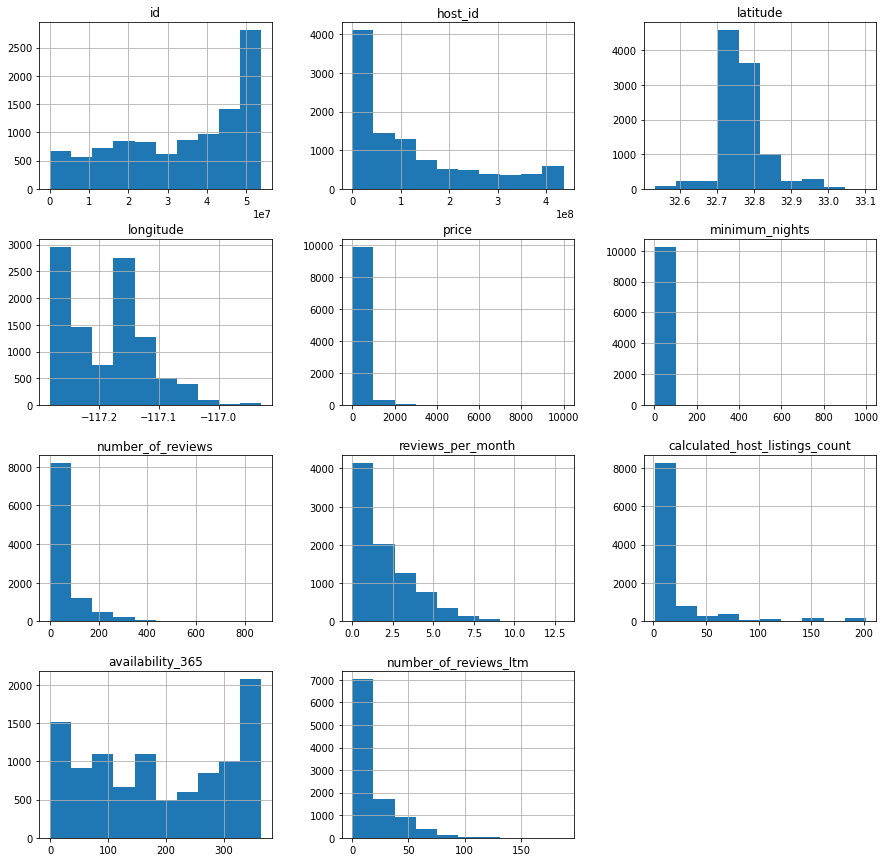

In [ ]:
# plotar o histograma das variáveis numéricas
df.hist(figsize=(15,15));

Com a geração dos histogramas, podemos perceber que algumas colunas possuem uma distribuição bastante desigual, com por exemplo as colunas ``` price ``` e ``` minimum_nights ```. Vemos que o eixo x contem valores muito grandes e pouco expressivos nos histogramas, um sinal claro de outliers.


Na coluna ``` price ``` vemos que a grande maioria dos valores dos alugueis estão na faixa de até $5000, enquanto ``` minimum_nights ``` varia na faixa abaixo de 200 noites

#### **Q3.1. Presença de *outliers*?**

Alem da analise dos histogramas, para encontramos *outliers*, podemos utilizar os metodos describe `describe()` ou plotar um `boxplots` para a variável.

In [ ]:
# ver o resumo estatístico das variáveis numéricas utilizando o describe()
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,1.030100e+04,1.030100e+04,10301.000000,10301.000000,10301.000000,10301.000000,10301.000000,8789.000000,10301.000000,10301.000000,10301.000000
mean,3.388817e+07,1.201453e+08,32.767907,-117.185308,289.983108,6.594700,53.898845,2.000727,17.885545,188.304242,16.369187
std,1.634643e+07,1.256373e+08,0.063158,0.065041,382.561957,22.009448,84.874213,1.859501,37.414924,124.081456,21.312226
min,5.570000e+03,3.264000e+03,32.532487,-117.281710,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,2.014710e+07,2.171336e+07,32.727343,-117.250200,110.000000,1.000000,3.000000,0.530000,1.000000,76.000000,1.000000
50%,3.790845e+07,7.037592e+07,32.760670,-117.176900,176.000000,2.000000,18.000000,1.450000,3.000000,178.000000,7.000000
75%,4.916832e+07,1.837519e+08,32.796780,-117.144510,336.000000,3.000000,67.000000,2.990000,14.000000,313.000000,25.000000
max,5.390857e+07,4.362920e+08,33.101790,-116.929021,10000.000000,999.000000,869.000000,13.030000,202.000000,365.000000,188.000000


Olhando o resumo estatístico acima, podemos confirmar algumas hipóteses como:

* A variável `price` possui 75% do valor abaixo de 176, mediana de 382 e minimo de 0, porém seu valor máximo é 10000.
* A quantidade mínima de noites (`minimum_nights`) tem valor maximo de  999, muito acima de 365 dias no ano.

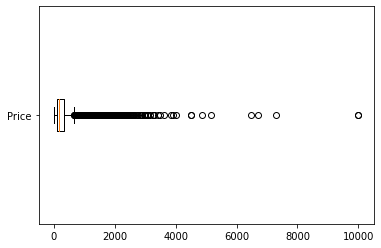

In [ ]:
# plotando os boxplots das variaveis price e minimum_nights
plt.boxplot(x=df['price'],vert=False,labels=['Price']);

Removeremos a maioria dos *outliers* com os seguintes passos:

* Definir o Q1 e Q3.
* Calcular o IQR.
* Definir o limite superior e inferior para cortar os outliers.
* Remover os outliers.

In [ ]:
df_clean = df.copy()

In [ ]:
# identificando os 1° quartil e 3° quartil de price
Q1_price = df.price.quantile(.25)
Q3_price = df.price.quantile(.75)

# calulo IQR de price
IQR_price = Q3_price - Q1_price
print('IQR da variável price: ', IQR_price)

# definindo os limites                                       
sup_price = Q3_price + 1.5 * IQR_price
inf_price = Q1_price - 1.5 * IQR_price

print('Limite superior de price: ', sup_price)
print('Limite inferior de price: ', inf_price)

IQR da variável price:  226.0
Limite superior de price:  675.0
Limite inferior de price:  -229.0


Aqui podemos ver que, apesar de não termos outliers na parte inferior, continuamos tendo valores iguais a zero, que precisam ser tratados.

In [ ]:
df[df['price'] == 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
6024,42875640,Pacific Shores Inn,311385424,Pacific Shores Inn,Pacific Beach,32.80131,-117.25755,Hotel room,0,1,0,NaN,NaN,1,0,0
6079,43077965,PB Surf Beachside Inn,311386648,PB Surf Beachside Inn,Pacific Beach,32.80051,-117.25703,Hotel room,0,1,0,NaN,NaN,1,0,0
6206,43499167,La Jolla Cove,346934536,Brandon,La Jolla,32.84971,-117.27326,Hotel room,0,1,0,NaN,NaN,1,0,0


In [ ]:
# removendo alugueis com valores iguais a 0
df_clean.drop(df_clean[df_clean['price'] == 0].index,inplace=True)
df_clean[df_clean['price'] == 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm


In [ ]:
# removendo valores maiores que o limite superior de price
df_clean.drop(df_clean[df_clean['price'] > 675].index,inplace=True)

O boxplot mostra alguns dados como outliers, entretanto, esses estão sendo calculados em relação ao novo dataset, e nossa limpeza levou em consideração os quartis do dado original.

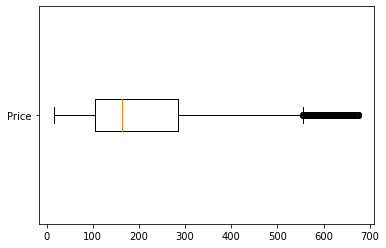

In [ ]:
plt.boxplot(x=df_clean['price'],vert=False,labels=['Price']);

In [ ]:
print('Shape antes da limpeza: ', df.price.count())
print('Shape após a limpeza: ',df_clean.price.count())
print(f'Diferença de: {df.price.count() - df_clean.price.count()} ou de {(df.price.count() - df_clean.price.count())/df.price.count()*100:.2f}%' )

Shape antes da limpeza:  10301
Shape após a limpeza:  9509
Diferença de: 792 ou de 7.69%


Podemos fazer o mesmo tratamento com a coluna `minimum_nights`

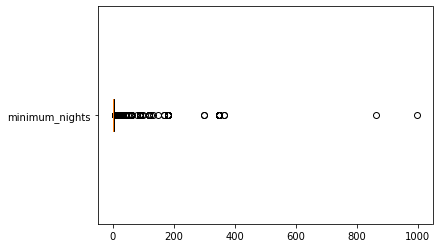

In [ ]:
plt.boxplot(x=df['minimum_nights'],vert=False,labels=['minimum_nights']);

In [ ]:
# identificando os 1° quartil e 3° quartil de minimum_nights
Q1_minimum_nights = df.minimum_nights.quantile(.25)
Q3_minimum_nights = df.minimum_nights.quantile(.75)

# calulo IQR de minimum_nights
IQR_minimum_nights = Q3_minimum_nights - Q1_minimum_nights
print('IQR da variável minimum_nights: ', IQR_minimum_nights)

# definindo os limites                                       
sup_minimum_nights = Q3_minimum_nights + 1.5 * IQR_minimum_nights
inf_minimum_nights = Q1_minimum_nights - 1.5 * IQR_minimum_nights

print('Limite superior de minimum_nights: ', sup_minimum_nights)
print('Limite inferior de minimum_nights: ', inf_minimum_nights)

IQR da variável minimum_nights:  2.0
Limite superior de minimum_nights:  6.0
Limite inferior de minimum_nights:  -2.0


In [ ]:
# removendo valores maiores que o limite superior de minimum_nights
df_clean.drop(df_clean[df_clean['minimum_nights'] > 6.0].index,inplace=True)

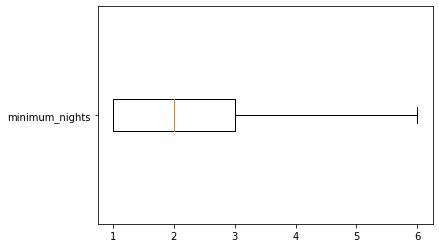

In [ ]:
plt.boxplot(x=df_clean['minimum_nights'],vert=False,labels=['minimum_nights']);

In [ ]:
print('Shape antes da limpeza: ', df.minimum_nights.count())
print('Shape após a limpeza: ',df_clean.minimum_nights.count())
print(f'Diferença de: {df.minimum_nights.count() - df_clean.minimum_nights.count()} ou de {(df.minimum_nights.count() - df_clean.minimum_nights.count())/df.minimum_nights.count()*100:.2f}%' )

Shape antes da limpeza:  10301
Shape após a limpeza:  7931
Diferença de: 2370 ou de 23.01%


Percebemos que utilizando tanto o limite superior de `minimum_nights` quanto de `minimum_nights` retiramos uma parcela significativa das entradas no dataset, 23.01% e 7.69% respectivamente. Devido a isso, uma solução mais adequada seria escolher um valor arbitrário para os dois atributos, sendo removido a maior quantidade de *outliers* possiveis como tambem não tenha tanto impacto na quantidade de entradas excluídas do dataset.

Vamos checar os histogramas novamente após a limpeza dos *outliers*

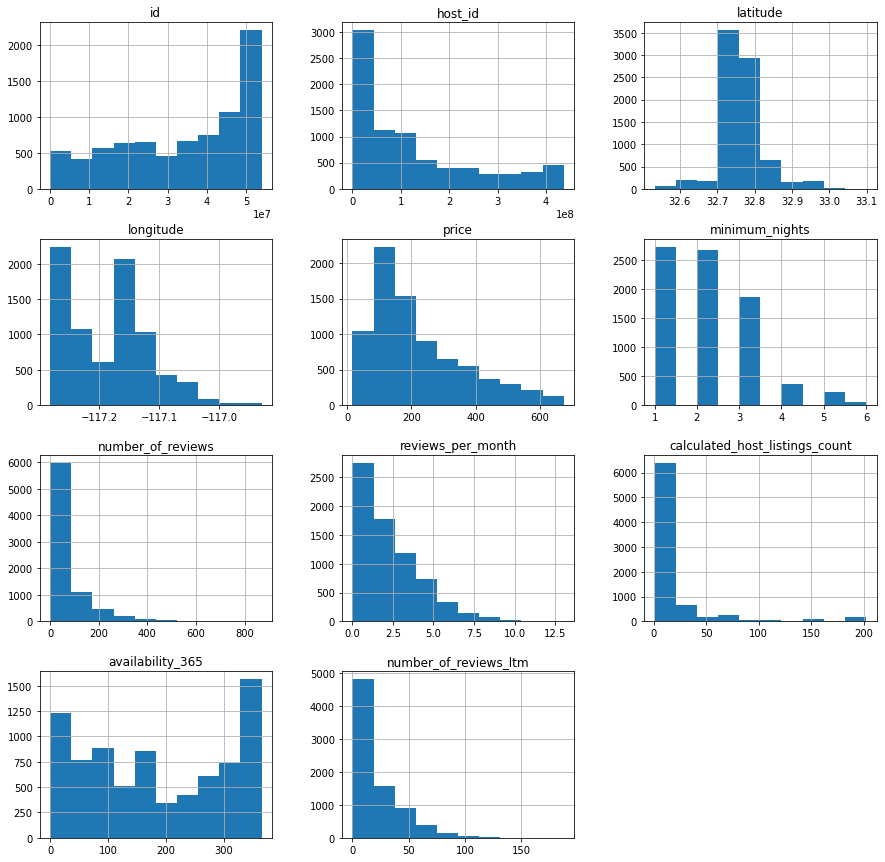

In [ ]:
df_clean.hist(figsize=(15,15));

In [ ]:
df_clean.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,7.931000e+03,7.931000e+03,7931.000000,7931.000000,7931.000000,7931.000000,7931.000000,7030.000000,7931.000000,7931.000000,7931.000000
mean,3.399651e+07,1.227516e+08,32.764129,-117.183490,219.541420,2.098222,63.836591,2.289427,17.460219,182.969361,19.797882
std,1.635757e+07,1.257123e+08,0.059904,0.065456,146.277224,1.063820,91.539650,1.917734,37.141874,124.882955,22.715886
min,2.996700e+04,3.264000e+03,32.532487,-117.281440,16.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,2.025613e+07,2.243816e+07,32.727555,-117.249755,108.000000,1.000000,5.000000,0.780000,1.000000,72.000000,2.000000
50%,3.810128e+07,7.590669e+07,32.757860,-117.174320,173.000000,2.000000,26.000000,1.820000,3.000000,171.000000,12.000000
75%,4.928994e+07,1.891667e+08,32.792860,-117.141610,300.000000,3.000000,85.000000,3.360000,13.000000,312.000000,31.000000
max,5.390386e+07,4.362920e+08,33.097860,-116.929021,675.000000,6.000000,869.000000,13.030000,202.000000,365.000000,188.000000


In [ ]:
# quantidade retirada do dataset em %
print(f'{(1 - (df_clean.shape[0] / df.shape[0]))*100:.2f}%')

23.01%


Após a limpeza dos *outliers* conseguimos observar uma mudança significativa nos histogramas, principalmente nos de `price` e `minimum_nights`. Além disso podemos perceber:
* O valor da mediana de `price` sofreu pouica alteração, saindo de 176 para 173.
* O valor da mediana de `minimum_nights` não sofreu alteração.
* percebe-se tambem que aproximadamente 23.01% dos dados originais foram removidos após a alimpreza dos *outliners*.



### **Q4. Qual a média dos preços de aluguel?**

In [ ]:
# ver a média da coluna `price``
print(f'Preço médio dos alugueis: ${df_clean.price.mean():.2f}')

Preço médio dos alugueis: $219.54


Verificamos quanto cada tipo de aluguel (`room_type`) representa de receita.

In [ ]:
print("Soma dos valores dos quartos por tipo de quarto:")
room_type_sum_prices = df_clean.groupby('room_type').sum()[['price']]; #ou room_type_sum_prices = df_clean.groupby(['room_type']).price.sum()
print(room_type_sum_prices,"\n")

print("Representação por porcentagem:")
room_type_sum_prices / room_type_sum_prices.sum()*100

Soma dos valores dos quartos por tipo de quarto:
                   price
room_type               
Entire home/apt  1576571
Hotel room           714
Private room      159722
Shared room         4176 

Representação por porcentagem:


,price
room_type,
Entire home/apt,90.545968
Hotel room,0.041007
Private room,9.173189
Shared room,0.239837


Percebemos que so tipos de quartos `Entire home/apt` representam aproximadamente 90% das receitas do AirBnB para a região de San Diego, enquanto os tipos de quarto `Hotel room` não representão valor significativo.

In [ ]:
# preço medio por bairro ordenado decrescente
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=False)

neighbourhood
Terra Nova                     338.166667
Wooded Area                    326.037037
Mission Bay                    324.328514
La Jolla                       322.383529
Del Mar Heights                307.931034
                                  ...    
Nestor                          83.083333
Amphitheater And Water Park     79.500000
Yosemite Dr                     76.500000
Paseo Ranchoero                 68.500000
Tijuana River Valley            55.500000
Name: price, Length: 100, dtype: float64

Os aluguéis de quartos mais caros da cidade são: Terra Nova, Wooded Area e Mission Bay

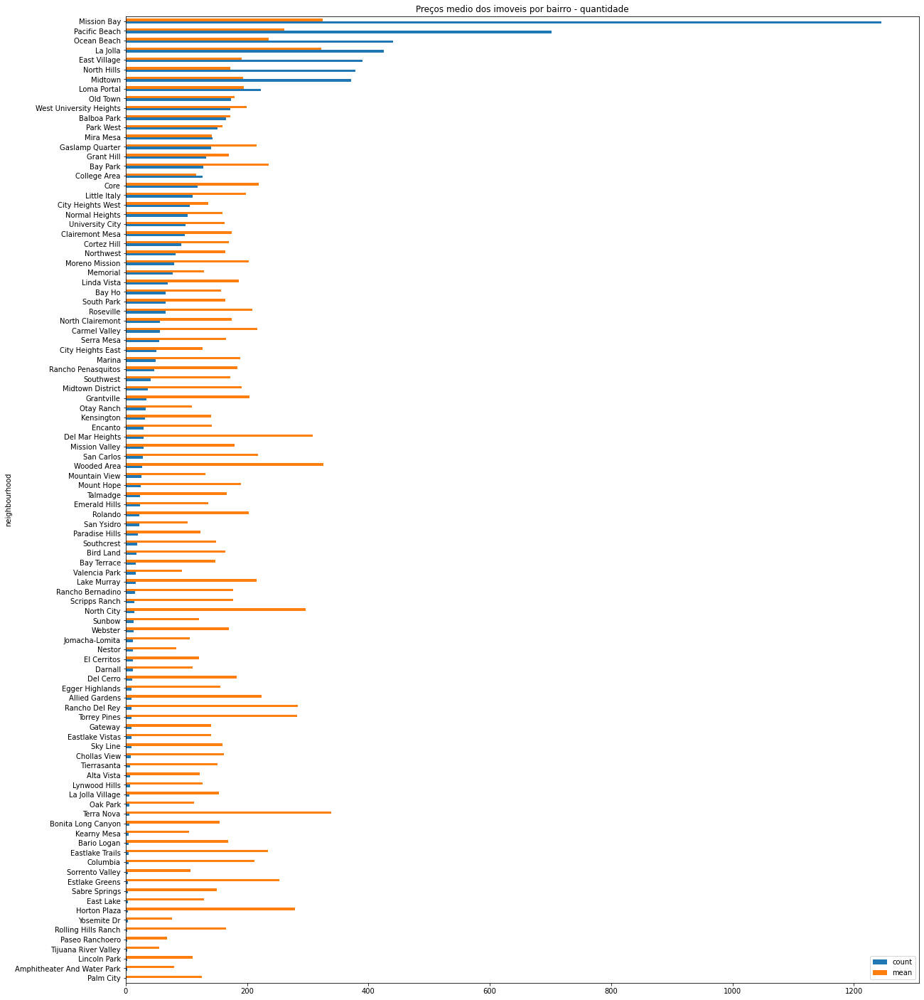

In [ ]:
# grafico valor medio por bairro - quantidade de anuncios
#df_clean.groupby(['neighbourhood'])[['price']].aggregate(['mean','count'])
df_clean.groupby(['neighbourhood']).agg(
    count=pd.NamedAgg(column="price", aggfunc="count"),
    mean=pd.NamedAgg(column="price", aggfunc="mean")
).sort_values(by='count').plot.barh(figsize=(20,25),title="Preços medio dos imoveis por bairro - quantidade");

No grafico acima podemos ver a relação da media de preços por cada bairro pela quantidade de anuncios dos mesmo. Podemos perceber que mesmo os bairros de *Mission Bay* e *La Jolla* serem respectivamentes os 3º e 4º mais caros a partir da media, são tambem o 1º e 5º mais anunciados.

### **Q5. Qual a correlação existente entre as variáveis**

In [ ]:
# criar uma matriz de correlação
# mostrar a matriz de correlação
matriz_correlacao = df_clean.corr()
display(matriz_correlacao)

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
id,1.000000,0.488398,-0.080239,0.142313,0.030226,-0.163094,-0.514612,0.139697,0.112354,0.044876,-0.133143
host_id,0.488398,1.000000,-0.060362,0.112446,-0.008685,-0.086686,-0.264872,0.071840,0.060134,0.108293,-0.105683
latitude,-0.080239,-0.060362,1.000000,-0.434622,0.147353,0.114585,-0.042792,-0.137276,0.052427,0.031536,-0.077367
longitude,0.142313,0.112446,-0.434622,1.000000,-0.371304,-0.145235,-0.029876,0.080135,-0.222257,-0.105943,-0.022623
price,0.030226,-0.008685,0.147353,-0.371304,1.000000,0.206874,-0.206341,-0.214582,0.290244,0.145061,-0.165748
minimum_nights,-0.163094,-0.086686,0.114585,-0.145235,0.206874,1.000000,-0.074890,-0.243829,-0.128402,-0.042966,-0.154235
number_of_reviews,-0.514612,-0.264872,-0.042792,-0.029876,-0.206341,-0.074890,1.000000,0.604084,-0.173074,-0.078889,0.685381
reviews_per_month,0.139697,0.071840,-0.137276,0.080135,-0.214582,-0.243829,0.604084,1.000000,-0.174322,-0.073874,0.833917
calculated_host_listings_count,0.112354,0.060134,0.052427,-0.222257,0.290244,-0.128402,-0.173074,-0.174322,1.000000,0.292596,-0.168538
availability_365,0.044876,0.108293,0.031536,-0.105943,0.145061,-0.042966,-0.078889,-0.073874,0.292596,1.000000,-0.065380


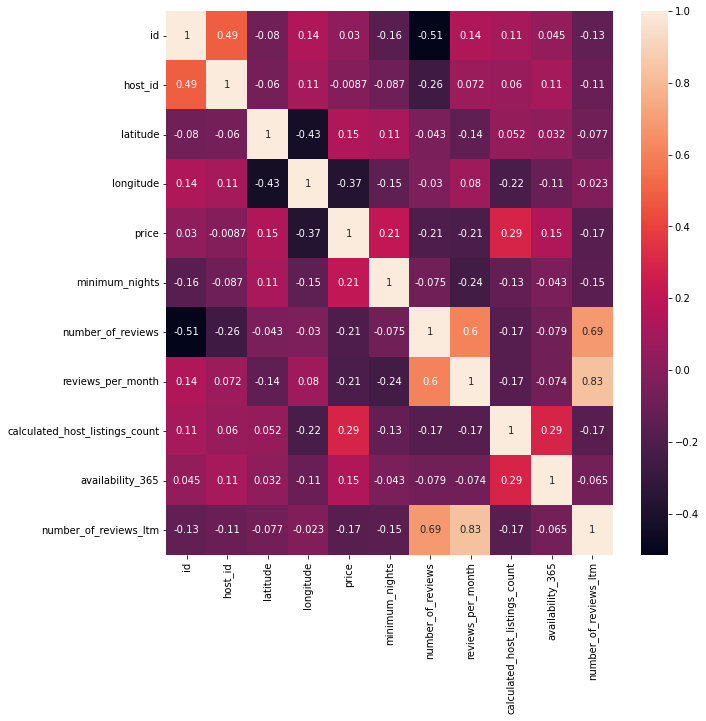

In [ ]:
# plotar um heatmap a partir das correlações
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(matriz_correlacao,annot=True);

Conseguimos observar uma forte correlação linear com as colunas:
* `reviews_per_month` e `number_of_reviews_ltm`, ou seja existe uma relação com a quantidade de reviews por mês com a quantidade dos ultimos 12 meses.
* O mesmo raciocínio pode ser utilizado com a relação entre `number_of_reviews_ltm` e `number_of_reviews`, e entre `reviews_per_month` com `number_of_reviews`.
Já a coluna price apreseta sua correlação mais forte, de 0.29, com `calculated_host_listings_count`.

### **Q6. Qual o tipo de imóvel mais alugado no Airbnb?**

In [ ]:
# mostrar a quantidade de cada tipo de imóvel disponível
df_clean['room_type'].value_counts()

Entire home/apt    6371
Private room       1487
Shared room          67
Hotel room            6
Name: room_type, dtype: int64

In [ ]:
# mostrar a porcentagem de cada tipo de imóvel disponível
df_clean['room_type'].value_counts() / df.shape[0]*100

Entire home/apt    61.848364
Private room       14.435492
Shared room         0.650422
Hotel room          0.058247
Name: room_type, dtype: float64

Das 4 opções fornecidas pelo AirBnB para a a região de *San Diego*, casa/apartamento inteiro são os mais anunciados. Como nas analises anteriores, as casa/apartamento inteiro são o que mais representa em valor total dos anuncios. Para melhor observação iremos criar um grafico para analise visual.

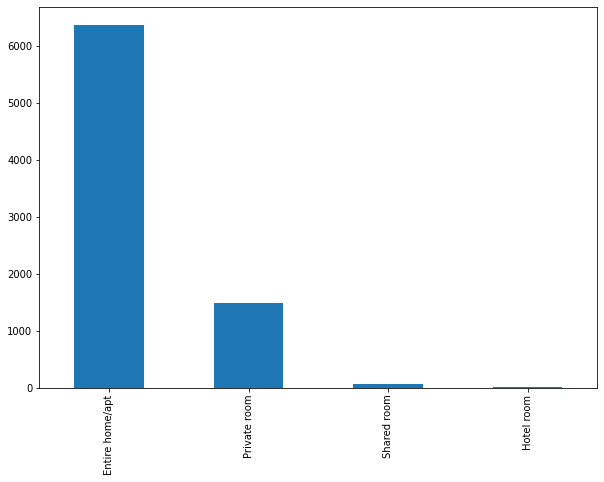

In [ ]:
df_clean['room_type'].value_counts().plot(kind='bar', figsize=(10,7));

### **Q7. Qual a localidade mais cara do dataset?**



In [ ]:
# ver preços por bairros, na média
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=False)

neighbourhood
Terra Nova                     338.166667
Wooded Area                    326.037037
Mission Bay                    324.328514
La Jolla                       322.383529
Del Mar Heights                307.931034
                                  ...    
Nestor                          83.083333
Amphitheater And Water Park     79.500000
Yosemite Dr                     76.500000
Paseo Ranchoero                 68.500000
Tijuana River Valley            55.500000
Name: price, Length: 100, dtype: float64

In [ ]:
# a partir do bairro de Terra Nova, ver qual o tipo de quarto que mais possui anuncios
df_clean[df_clean['neighbourhood'] == 'Terra Nova']['room_type'].value_counts()

Entire home/apt    4
Private room       2
Name: room_type, dtype: int64

In [ ]:
# qual a media de valor dos anuncios em Terra Nova que são do tipo de quarto 'Enterie home/apt'
df_clean[df_clean['neighbourhood'] == 'Terra Nova'].groupby(['room_type']).price.mean()

room_type
Entire home/apt    445.0
Private room       124.5
Name: price, dtype: float64

O bairro mais caro, na média, é *Terra Nova*. Tomando como base a media geral de `minimum_nights` e sabendo que o `room_type` que mais possui anuncios na região são do tipo *Entire home/apt*, obtemos um valor de aproximadamente:
2 * 445 = $890



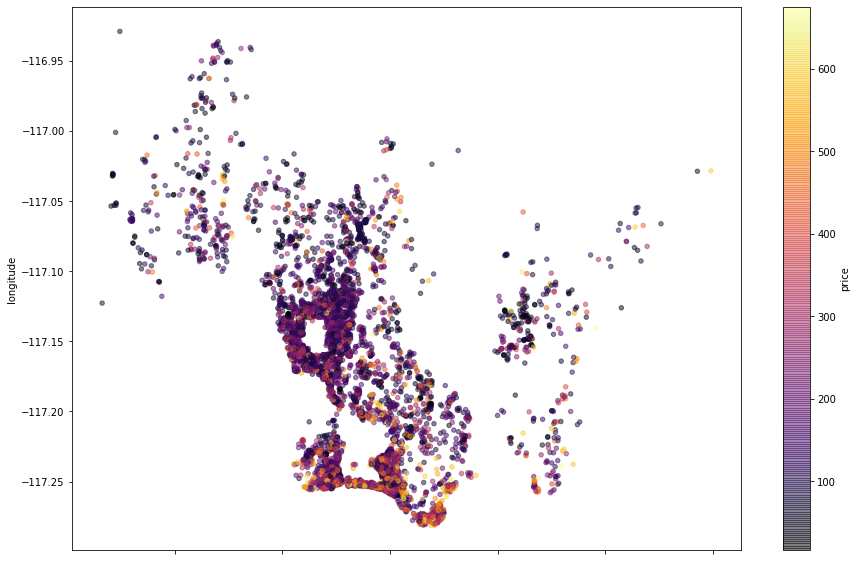

In [ ]:
# plotar os imóveis pela latitude-longitude
df_clean.plot(x='latitude', y='longitude', kind='scatter', c='price', cmap='inferno', alpha= 0.5, figsize=(15, 10));

Plotando os pontos dos quartos a partir da latitude-longitude e colorindo por preços como na figura acima, percebemos que a região costeira abriga uma maior quantidade de casas com preço alto. Podemos plotar também por tipo de quarto:

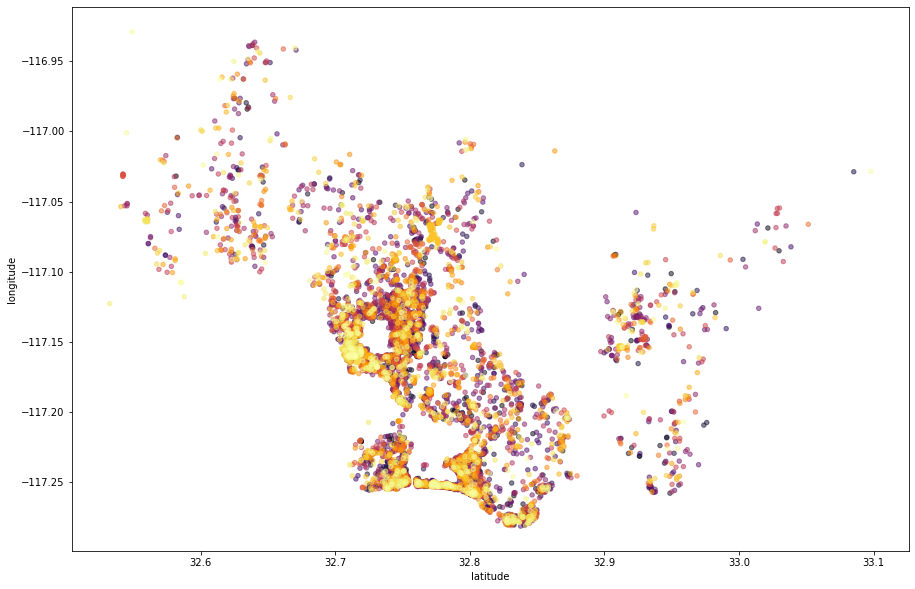

In [ ]:
types_of_room = df_clean['room_type']
cmap = plt.get_cmap('inferno')
colors = cmap(np.linspace(0, 1, len(types_of_room)))
df_clean.plot(x='latitude', y='longitude', kind='scatter', c=colors, alpha= 0.5, figsize=(15, 10));

Para observarmos detalhadamente os pontos sobre o mapa, podemos utilizar a biblioteca *Folium*.

In [ ]:
from folium.plugins import MarkerCluster

m = folium.Map(location=[32.8153, -117.13532],zoom_start=11, tiles= 'cartodbpositron')
marker_cluster_active = MarkerCluster()

for i, data in df_clean.iterrows():
  #print(data)
  #print(data['name'])
  #folium.CircleMarker(location = [data['latitude'], data['longitude']],
  #                      popup = folium.Popup(data['name'], parse_html=True),
  #                      radius =5).add_to(m)
  marker_active = folium.Marker(location=[data['latitude'], data['longitude']], popup="ok" ,icon = folium.Icon(color='green',icon='ok-sign'))
  marker_cluster_active.add_child(marker_active)

m.add_child(marker_cluster_active)

### **Q8. Qual é a média do mínimo de noites para aluguel (minimum_nights)?**

In [ ]:
# ver a média da coluna `minimum_nights``
print(f'Média de noite é de {df_clean["minimum_nights"].mean():.2f}')

Média de noite é de 2.10


## Conclusões


Apenas com essa analise superficial dos dados do Airbnb da região de *San Diego*, podemos perceber a presença de outliers em algumas variáveis do dataset, assim como valores ausentes em outras. Com o tratamento dessas inconsistencias conseguimos extrair informações interessantes como:
* Mais de 60% dos anuncios são do tipo *Entire home/apt*, ou seja, casas ou apartamentos inteiros.
* Região costeira abriga uma maior quantidade de casas com preço alto.
* Há pouca correlação entre as variáveis, com exceção das colunas que referenciam à algum tipo de review, como `number_of_reviews_ltm` e `reviews_per_month`.
* O valor médio dos alugeuis gira em torno de 219.54
* os anuncios do tipo *Entire home/apt* representam aproximadamente 90% do total do valor dos imoveis da região.
